In [1]:
import empyrical as ep
import pandas as pd
import numpy as np
import qlib
from qlib.data import D
from qlib.workflow import R  # 实验记录管理器
# from qlib.workflow.record_temp import PortAnaRecord, SigAnaRecord, SignalRecord
from qlib.data.dataset.loader import StaticDataLoader
from qlib.data.dataset.handler import DataHandlerLP
from qlib.data.dataset import DatasetH
from qlib.data.dataset.processor import DropnaLabel, ProcessInf, CSRankNorm, Fillna
# from qlib.utils import init_instance_by_config
from typing import List, Tuple, Dict

from scr.core import calc_sigma, calc_weight
from scr.factor_analyze import clean_factor_data, get_factor_group_returns
from scr.qlib_workflow import run_model
from scr.plotting import model_performance_graph, report_graph

import matplotlib.pyplot as plt
import seaborn as sns

# plt中文显示
plt.rcParams["font.sans-serif"] = ["SimHei"]
# plt显示负号
plt.rcParams["axes.unicode_minus"] = False

In [2]:
qlib.init(provider_uri="qlib_data", region="cn")

[12588:MainThread](2023-04-11 18:10:07,360) INFO - qlib.Initialization - [config.py:416] - default_conf: client.
[12588:MainThread](2023-04-11 18:10:07,362) INFO - qlib.Initialization - [__init__.py:74] - qlib successfully initialized based on client settings.
[12588:MainThread](2023-04-11 18:10:07,363) INFO - qlib.Initialization - [__init__.py:76] - data_path={'__DEFAULT_FREQ': WindowsPath('D:/WorkSpace/visualization_stock_market/sqlalchemy_to_data/测试相关/凸显度因子/qlib_data')}


In [3]:
# 使用D.feature与DataLoader,DataHandlerLP,DatasetH获取数据的数据MutiIndex索引不同
# 前者Instrument,datetime后者是datetime,Instrument
POOLS: List = D.list_instruments(D.instruments("pool"), as_list=True)
pct_chg: pd.DataFrame = D.features(POOLS, fields=["$close/Ref($close,1)-1"])
pct_chg: pd.DataFrame = pct_chg.unstack(level=0)["$close/Ref($close,1)-1"]

# 未来期收益
next_ret: pd.DataFrame = D.features(POOLS, fields=["Ref($open,-2)/Ref($open,-1)-1"])
next_ret.columns = ["next_ret"]
next_ret: pd.DataFrame = next_ret.swaplevel()
next_ret.sort_index(inplace=True)

# 基准
bench: pd.DataFrame = D.features(["000300.SH"], fields=["$close/Ref($close,1)-1"])
bench: pd.Series = bench.droplevel(level=0).iloc[:, 0]

# 原始构造

## 理论基础

有效市场假说认为股票价格反映了所有可用信息，投资者无法通过观察市场变化或者分析市场数据来预测未来
股票价格的走势。尽管如此，仍有大量的实证研究表明金融市场中存在许多资产定价模型所无法解释的异象。为了
解释这些异象，许多学者开始从行为金融学的角度对投资者进行投资决策时的心理展开研究，数十年来涌现了大量
高质量的行为金融学实证研究文献。

在行为金融学领域中，最具代表性的人物之一莫过于 2002 年因提出前景理论（Prospect Theory, 1979）而获得
诺贝尔经济学奖的学者 Kahneman 及其搭档 Tversky。前景理论研究了人们如何对未来事件做出预测、决策和行为
选择，以及这些决策和行为选择如何受到情绪、偏见和其他心理因素的影响。投资者在多项资产中进行选择时，可
能会出现不同的结果，每个结果都存在相应的发生概率。因此，某个决策的最终价值等于所有可能发生的结果的概
率加权平均，投资者会在所有的决策中选择价值最高的作为最终决策，即∑ 𝜋(𝑥)𝑣(𝑥)，𝜋(𝑥)为结果发生的概率，𝑣(𝑥)为某项选择所具有的价值。基于累积前景理论，Barberis 等（2016）在个股层面上构建了每只股票的 TK（Tversky、Kahneman）价值，认为 TK 价值较高的股票对于投资者而言具有更高的吸引力，因此投资者倾向于过
度高估高 TK 的股票，而低估了低 TK 股票的价值，一个做多低 TK 价值股票、做空高 TK 价值股票的策略组合能够在统计上获得显著的超额收益。

近几年，凸显理论（Salience Theory）亦是行为金融学领域中对资产定价具有重要影响的一个热门研究方向。
BGS（2012）认为在资产的横向比较中，投资者的注意力往往会被吸引到平均而言最具有凸显性的回报上，而不凸显的回报往往会被忽略。例如，我们可能只会记得某只股票当月发生过涨停，而不记得它微涨 2%的时候。因此，投资者对于不同的收益大小会存在不同的心理权重，将这种心理偏好以定量的形式进行表达，能够帮助更加精细化地描绘资产价格相对于其真实价值的偏离程度。Cosemans 等（2021）基于凸显理论构建了 ST 指标，将投资者的投资决策心理进行了还原。当 ST 为正时，股票的最高回报较为突出，导致投资者过度关注股票的上涨潜力，从而成为风险寻求者；当投资者过分关注股票的负收益并强调其下行风险时，ST 为负，相关的股票将面临过度低估。

将前景理论与凸显理论进行对比可以发现：在前景理论中，投资者进行投资决策的心理权重偏差在于给予了和尾部收益相关的小概率事件更高的权重；而在凸显理论中，极端收益被加权的原因并不是因为它们的发生概率小，而是因为它们在截面上相对市场平均收益来说具有凸显性，凸显理论模型认为资产的溢价不是由投资者的偏好驱动的，而是由资产收益相对市场平均收益脱颖而出的程度驱动的，当中既包含了时序信息，也包含了截面信息。

**Step1:**

我们⾸先计算第d天股票收益和市场收益之间的距离，如下所示：

$$\sigma(r_{i,d})=\frac{|r_{i,d}-\overline{r_{d}}|}{|r_{i,d}|+|\overline{r_{d}}|+\theta} \tag{1}$$

其中$r_{i,d}$是股票的d日的日度收益,$\overline{r_d}$是d日截面上所有股票的平均收益。为了防止分母为0的情况,$\theta$设置为0.1。

**Step2:**

然后将每个股票根据过去一个月每天的$\delta(r_{i,d})$进行排序,该股票每日的排序为$k_{i,d}$。根据排序值计算Salience Weights $\omega$:

$$\omega_{i,d}=\frac{\delta^{k_{i,d}}}{\sum_{d'}{\delta^{k_{i,d}}\pi_{d'}}} \tag{2}$$

其中$\delta$(默认为0.7)是一个参数,用于控制Salience扭曲的程度;$\pi=1/N$。当k=1时,股票收益率的凸显性最强,而当k=max时,股票收益率的凸显度最弱。

**Step3:**

计算每个月日度的$\omega_{i,d}$与收益率的协方差就是该股票当月的STR值

$$ST=cov(\omega_{i,d},r_{i,d})\tag{3}$$

In [4]:
# 计算w
w: pd.DataFrame = pct_chg.pipe(calc_sigma).pipe(calc_weight)
# 计算st因子
STR: pd.DataFrame = w.rolling(20).cov(pct_chg)

STR: pd.Series = STR.stack()
STR.name = "STR"

In [5]:
feature_df: pd.DataFrame = pd.concat((next_ret, STR), axis=1)
feature_df.columns = pd.MultiIndex.from_tuples(
    [("label", "next_ret"), ("feature", "STR")]
)

feature_df.head()

label feature
                       next_ret     STR
datetime   instrument                  
2013-10-08 000001.SZ   0.039604     NaN
           000002.SZ  -0.011579     NaN
           000004.SZ   0.000770     NaN
           000005.SZ   0.020000     NaN
           000006.SZ   0.006343     NaN

## 因子分析

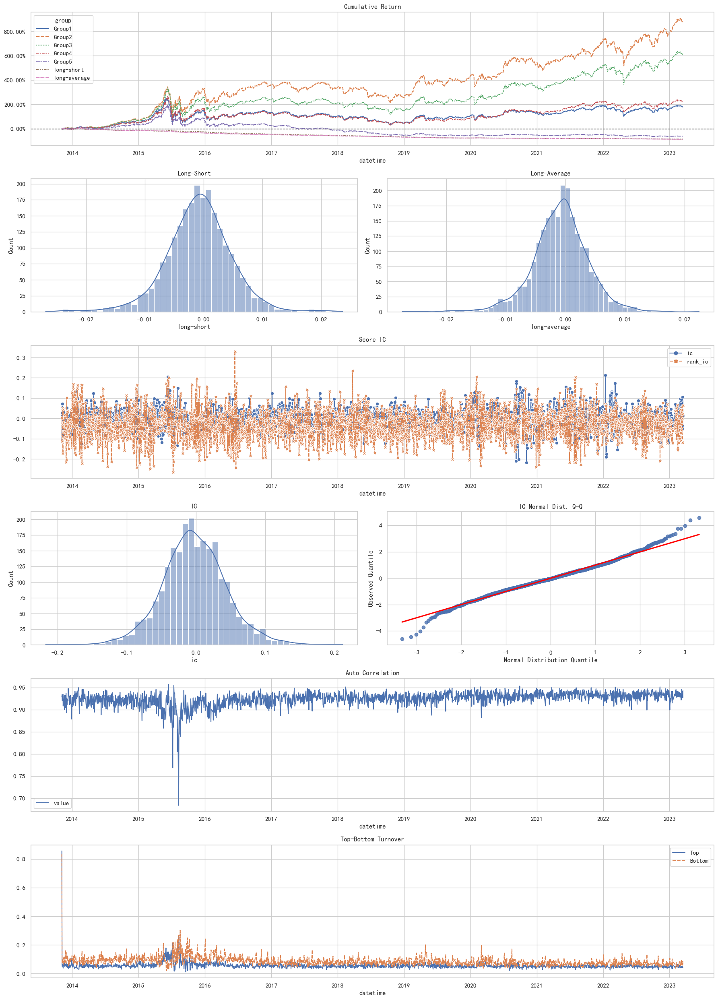

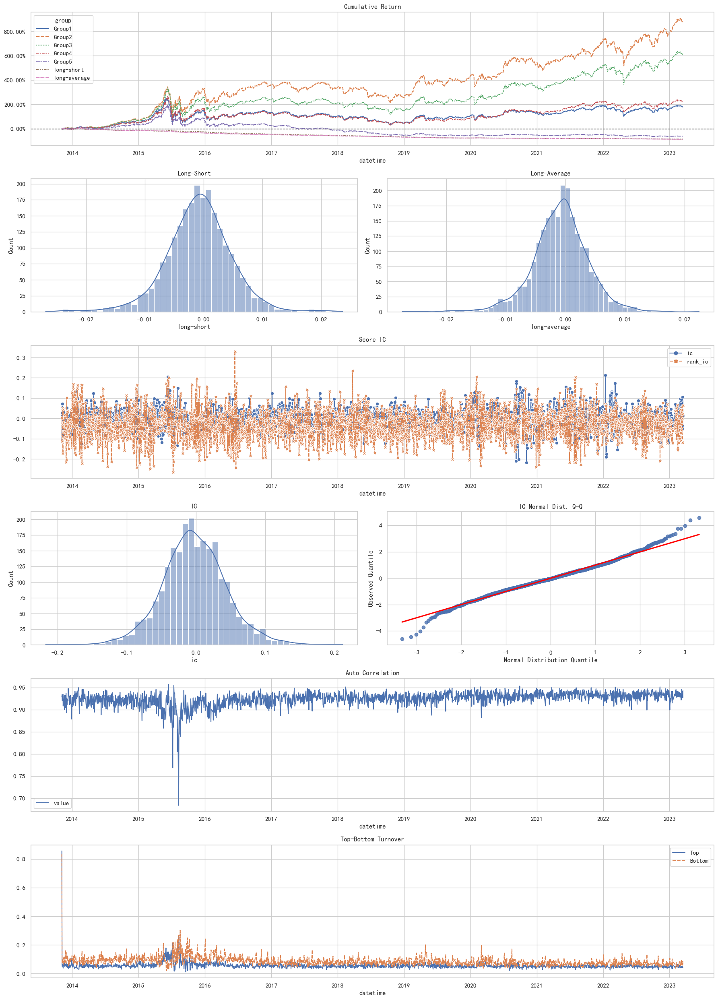

In [6]:
score_df:pd.DataFrame = feature_df.dropna().copy()
score_df.columns = ['label','score']

model_performance_graph(score_df)

# 方正证券构造

显著理论（salience theory）的出现解决了截⾯上做⽐较的问题。Cosemans和Frehen(2021)使⽤显著理 论构造了因⼦，他们认为那些收益率过分⾼于市场收益的股票，会吸引投资者的注意⼒，并引起投资者的 过度买⼊，进⽽股价在未来会发⽣回落。我们将这种⼼理称为“守株待兔”⼼理，投资者认为这种极端偏离 市场的⾼收益会再次出现,因此纷纷买⼊这些股票开始等待。

相反,那些收益率过分低于市场收益率的股票，会对投资者产⽣恐慌⼼理，并引起投资者的过度卖出，进 ⽽股价在未来发⽣补涨。我们将这种⼼理称为“草⽊皆兵”⼼理，投资者认为这种极端偏离市场的低收益 （或称为严重亏损）会再次出现,因此纷纷卖出这些股票,⼩⼼远离它们。

## 初始构造
报告提出了**将显著理论与反转因⼦相结合的新构造⽅法**。即将股票每⽇的收益率,视作投资者做出决策权重的依据,将每天收益率偏离市场的程度(我们取多头端的逻辑，将其简称为"惊恐度")作为极端收益对投资者决策权重的扭曲程度,**使⽤"惊恐度"直接加权每⽇收益率**,来模拟投资者决策过程,构造了"原始惊恐"因⼦。

**定义惊恐度**
Cosemans和Frehen(2021)给出了衡量"惊恐度"的计算方法,本文借鉴了该构造方式,具体如下:

1. 取中证全指(000985.SH)指数收益作为市场水平的代表，将中证全指的每日收益率(今日收盘指数/昨日收盘指数-1)作为今日市场收益率水平。 
2. 计算个股收益率与市场收益率的差值,再取绝对值,作为个股相对市场收益率的偏离水平,记为"偏离项";计算个股收益率的绝对值,加市场收益率的绝对值，再加0.1,作为市场总体的收益水平,记为"基准项"。 
3. 使用"偏离项"除以"基准项"，得到该股票在该日的"惊恐度"。

![avatar](img/20230411_1.png)

**惊恐度因子**

接下来我们使用股票日度交易数据构造“原始惊恐”因子，具体步骤 如下:
1. 将每日股票收益率(今收/昨收-1)直接作为当日股票的决策分。 
2. 将每日的"惊恐度"与每日的收益率相乘,得到加权调整后的决策分,简称"加权决策分"。 
3. 每月月底，分别计算过去 20 个交易日的"加权决策分"的**均值**和**标准差**,分别作为对"20日收益率因子"和"20日波动率因子"的改进，分别记为"惊恐收益"因子和"惊恐波动"因子,并将二者等权合成为"原始惊恐"因子。

**以下因子变形无非根据逻辑构造权重项**

---
## 波动率加剧

计算每日个股的波 动率，并将其加入权重的部分，构造“波动率加剧-惊恐”因子。具体步骤如下：
1. 取股票 1 分钟频率的行情数据，计算每分钟收盘价相对上一分钟 收盘价的涨跌幅，将全天每分钟收益率求标准差，得到这一天该个股的波动率。
2. 计算每天每只股票的收益率和“惊恐度”。
3. 将每天的波动率、“惊恐度”和收益率相乘，作为当日的加权决策分。
4. 每月月底，分别计算过去 20 日的加权决策分的均值和标准差，记 为“波动率加剧-惊恐收益”因子和“波动率加剧-惊恐波动”因子，并将二者等权合成为“波动率加剧-惊恐”因子。

## 个人投资者交易占比

计算 每日个股的个人投资者交易占比，并将其加入权重的部分，构造“个人投资者交易比-惊恐”因子。具体步骤如下：
1. 参考wind 资金流指标定义，我们将单笔成交金额小于4万元的交易，视为个人投资者交易。我们计算每天个股个人投资者卖出和买入的金额均值，再除以个股的当日总体成交金额，得到当日个股的个人投资者交易比。
2. 如上述计算每天的收益率和“惊恐度”。
3. 将每天的个人投资者交易比、“惊恐度”和收益率相乘，作为当 日的加权决策分。
4. 每月月底，分别计算过去 20 日的加权决策分的均值和标准差，记 为“个人投资者交易比-惊恐收益”因子和“个人投资者交易比-惊恐波动”因子，并将二者等权合成为“个人投资者交易比-惊恐”因子。

## 注意力衰减
考虑将“惊恐度”减去过去两天的均值，构造衰 减后的“惊恐度”，并将其加入权重的部分，构造“注意力衰减-惊恐”因子。具体步骤如下：
1. 计算每天的“惊恐度”，将 t 日的惊恐度，减去 t-1 日和 t-2 日的 “惊恐度”的均值，得到一个差值，由于该差值需要作为权重信息来 使用，因此要保证指标为正数，这里将该差值为负的交易日的数据都替换为空值，仅保留将 t 日的惊恐度大于 t-1 日和 t-2 日的“惊恐度”均值的交易日，将其记为衰减后的“惊恐度”。
2. 计算每天的收益率。
3. 将每天的衰减后的“惊恐度”和收益率相乘，作为当日的加权决 策分。
4. 每月月底，分别计算过去 20 日的加权决策分的均值和标准差（由 于上述差值为负的日子都替换为了空值，导致衰减后的“惊恐度”覆 盖度较低，因此本处为了提高最终因子覆盖率，只要每月加权决策分 数据足够 5 条，就可以计算，下同），记为“注意力衰减-惊恐收益” 因子和“注意力衰减-惊恐波动”因子，并将二者等权合成为“注意力衰减-惊恐”因子。

In [7]:
# 计算获得惊恐度,准准收益使用的沪深300收益
sigma: pd.DataFrame = pct_chg.pipe(calc_sigma, bench=bench)
# 加权决策分
weighted: pd.DataFrame = sigma.mul(pct_chg)
# 加权决策分均值
avg_score: pd.DataFrame = weighted.rolling(20).mean()

avg_score_ser: pd.Series = avg_score.stack()
avg_score_ser.name = "avg_score"

# 加权决策分标准差
std_score: pd.DataFrame = weighted.rolling(20).std()

std_score_ser: pd.Series = std_score.stack()
std_score_ser.name = "std_score"

# 等权合成惊恐度得分 - 后续可以用qlib的模型合成寻找最优
terrified_score: pd.DataFrame = (avg_score + std_score) * 0.5

terrified_score_ser: pd.Series = terrified_score.stack()
terrified_score_ser.name = "terrified_score"

terrified_df: pd.DataFrame = pd.concat(
    (avg_score_ser, std_score_ser, terrified_score_ser, next_ret), axis=1
)
terrified_df.sort_index(inplace=True)

terrified_df.head()

avg_score  std_score  terrified_score  next_ret
datetime   instrument                                                 
2013-10-08 000001.SZ         NaN        NaN              NaN  0.039604
           000002.SZ         NaN        NaN              NaN -0.011579
           000004.SZ         NaN        NaN              NaN  0.000770
           000005.SZ         NaN        NaN              NaN  0.020000
           000006.SZ         NaN        NaN              NaN  0.006343

## 因子分析

In [8]:
group_returns: pd.DataFrame = (terrified_df.pipe(pd.DataFrame.dropna)
                                           .pipe(clean_factor_data)
                                           .pipe(get_factor_group_returns, quantile=5))

group_cum:pd.DataFrame = ep.cum_returns(group_returns)

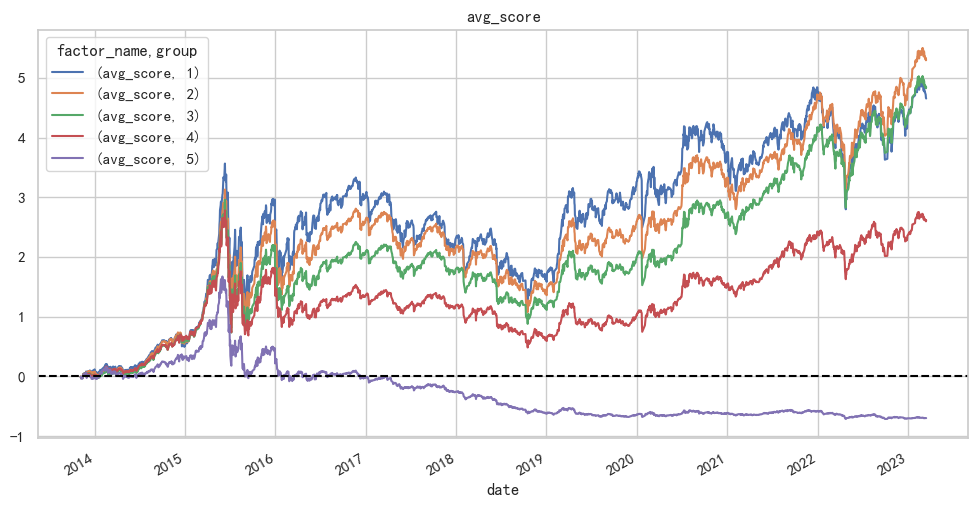

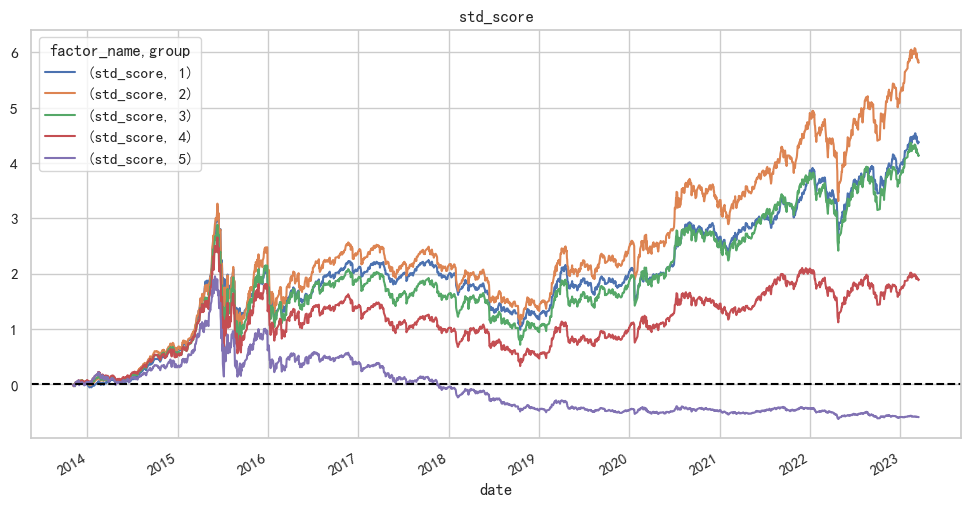

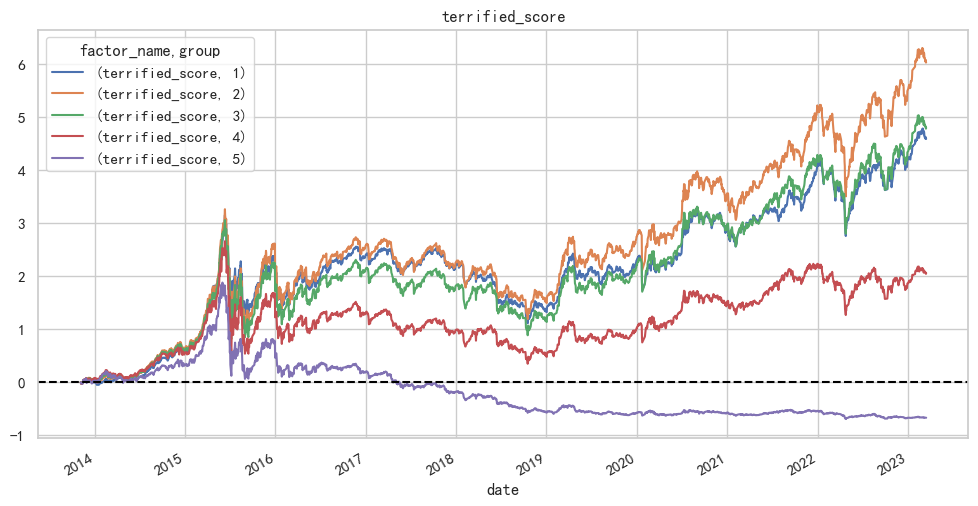

In [9]:
# 画图
for factor_name, df in group_cum.groupby(level=0, axis=1):
    df.plot(title=factor_name, figsize=(12, 6))
    plt.axhline(0, ls="--", color="black")

## 因子复合

In [10]:
test_df:pd.DataFrame = terrified_df[['avg_score','std_score','next_ret']].copy()
test_df.columns = pd.MultiIndex.from_tuples([("feature",'avg_score'),('feature','std_score'),('label',"next_ret")])

In [11]:
TARIN_PERIODS: Tuple = ("2014-01-01", "2017-12-31")
VALID_PERIODS: Tuple = ("2018-01-01", "2019-12-31")
TEST_PERIODS: Tuple = ("2020-01-01", "2023-02-17")

learn_processors = [DropnaLabel()]
infer_processors = [ProcessInf(), CSRankNorm(), Fillna()]

sdl = StaticDataLoader(config=test_df)
dh_pr = DataHandlerLP(
    instruments=POOLS,
    start_time=TARIN_PERIODS[0],
    end_time=TEST_PERIODS[1],
    process_type=DataHandlerLP.PTYPE_A,
    learn_processors=learn_processors,
    infer_processors=infer_processors,
    data_loader=sdl,
)

ds = DatasetH(
    dh_pr,
    segments={"train": TARIN_PERIODS, "valid": VALID_PERIODS, "test": TEST_PERIODS},
)

[12588:MainThread](2023-04-11 18:12:44,923) INFO - qlib.timer - [log.py:128] - Time cost: 0.966s | Loading data Done
[12588:MainThread](2023-04-11 18:12:50,443) INFO - qlib.timer - [log.py:128] - Time cost: 5.468s | ProcessInf Done
[12588:MainThread](2023-04-11 18:13:01,010) INFO - qlib.timer - [log.py:128] - Time cost: 10.566s | CSRankNorm Done
[12588:MainThread](2023-04-11 18:13:01,303) INFO - qlib.timer - [log.py:128] - Time cost: 0.293s | Fillna Done
[12588:MainThread](2023-04-11 18:13:01,401) INFO - qlib.timer - [log.py:128] - Time cost: 0.092s | DropnaLabel Done
[12588:MainThread](2023-04-11 18:13:01,402) INFO - qlib.timer - [log.py:128] - Time cost: 16.478s | fit & process data Done
[12588:MainThread](2023-04-11 18:13:01,402) INFO - qlib.timer - [log.py:128] - Time cost: 17.446s | Init data Done


In [12]:
record_dict: Dict = run_model(
    ds,
    "gbdt",
    start_time=TEST_PERIODS[0],
    end_time=TEST_PERIODS[1],
    experiment_name="terrified",
    trained_model="trained_model.pkl",
)

[18:13:04] 实验名:terrified,训练模型:trained_model.pkl,开始运行...                             ]8;id=27710;file://d:\WorkSpace\visualization_stock_market\sqlalchemy_to_data\测试相关\凸显度因子\scr\qlib_workflow.py\qlib_workflow.py]8;;\:]8;id=416166;file://d:\WorkSpace\visualization_stock_market\sqlalchemy_to_data\测试相关\凸显度因子\scr\qlib_workflow.py#347\347]8;;\

[12588:MainThread](2023-04-11 18:13:04,522) INFO - qlib.workflow - [exp.py:258] - Experiment 2 starts running ...
[12588:MainThread](2023-04-11 18:13:04,619) INFO - qlib.workflow - [recorder.py:341] - Recorder c02f41b191e74094bdde6cd7623a8590 starts running under Experiment 2 ...


Training until validation scores don't improve for 200 rounds
[20]	train's l2: 0.507638	valid's l2: 0.688012
[40]	train's l2: 0.507392	valid's l2: 0.687638
[60]	train's l2: 0.507319	valid's l2: 0.687538
[80]	train's l2: 0.507288	valid's l2: 0.687513
[100]	train's l2: 0.507268	valid's l2: 0.687507
[120]	train's l2: 0.507253	valid's l2: 0.687509
[140]	train's l2: 0.507242	valid's l2: 0.687512
[160]	train's l2: 0.507234	valid's l2: 0.687514
[180]	train's l2: 0.507228	valid's l2: 0.687517
[200]	train's l2: 0.507223	valid's l2: 0.687519
[220]	train's l2: 0.50722	valid's l2: 0.687522
[240]	train's l2: 0.507217	valid's l2: 0.687525
[260]	train's l2: 0.507212	valid's l2: 0.687528
[280]	train's l2: 0.50721	valid's l2: 0.68753
[300]	train's l2: 0.507207	valid's l2: 0.687531
Early stopping, best iteration is:
[102]	train's l2: 0.507266	valid's l2: 0.687506


[12588:MainThread](2023-04-11 18:13:18,590) INFO - qlib.workflow - [record_temp.py:196] - Signal record 'pred.pkl' has been saved as the artifact of the Experiment 2


'The following are prediction results of the LGBModel model.'
                          score
datetime   instrument          
2020-01-02 000001.SZ   0.017116
           000002.SZ  -0.029622
           000004.SZ  -0.028835
           000005.SZ   0.049089
           000006.SZ   0.058568
{'IC': 0.014233031511957966,
 'ICIR': 0.1078853506383252,
 'Rank IC': 0.04676958898544271,
 'Rank ICIR': 0.34778029330506244}


[12588:MainThread](2023-04-11 18:13:20,278) INFO - qlib.backtest caller - [__init__.py:93] - Create new exchange
[12588:MainThread](2023-04-11 18:13:43,728) WARNING - qlib.online operator - [exchange.py:219] - $open field data contains nan.
[12588:MainThread](2023-04-11 18:13:43,730) WARNING - qlib.online operator - [exchange.py:219] - $open field data contains nan.
[12588:MainThread](2023-04-11 18:13:47,470) WARNING - qlib.data - [data.py:666] - load calendar error: freq=day, future=True; return current calendar!
[12588:MainThread](2023-04-11 18:13:47,470) WARNING - qlib.data - [data.py:669] - You can get future calendar by referring to the following document: https://github.com/microsoft/qlib/blob/main/scripts/data_collector/contrib/README.md
[12588:MainThread](2023-04-11 18:13:47,477) WARNING - qlib.BaseExecutor - [executor.py:121] - `common_infra` is not set for <qlib.backtest.executor.SimulatorExecutor object at 0x000001CFE469A640>


backtest loop:   0%|          | 0/757 [00:00<?, ?it/s]

d:\anaconda3\envs\qlib_env\lib\site-packages\qlib\utils\index_data.py:482: RuntimeWarning: Mean of empty slice
  return np.nanmean(self.data)
[12588:MainThread](2023-04-11 18:13:52,301) INFO - qlib.workflow - [record_temp.py:505] - Portfolio analysis record 'port_analysis_1day.pkl' has been saved as the artifact of the Experiment 2


'The following are analysis results of benchmark return(1day).'
                       risk
mean               0.000063
std                0.012879
annualized_return  0.014996
information_ratio  0.075474
max_drawdown      -0.473379
'The following are analysis results of the excess return without cost(1day).'
                       risk
mean               0.000489
std                0.009613
annualized_return  0.116399
information_ratio  0.784898
max_drawdown      -0.360216
'The following are analysis results of the excess return with cost(1day).'
                       risk
mean               0.000067
std                0.009616
annualized_return  0.015885
information_ratio  0.107082
max_drawdown      -0.434490


[12588:MainThread](2023-04-11 18:13:52,316) INFO - qlib.workflow - [record_temp.py:530] - Indicator analysis record 'indicator_analysis_1day.pkl' has been saved as the artifact of the Experiment 2


'The following are analysis results of indicators(1day).'
     value
ffr    1.0
pa     0.0
pos    0.0
info {'class': 'Recorder', 'id': 'c02f41b191e74094bdde6cd7623a8590', 'name': 'mlflow_recorder', 'experiment_id': '2', 'start_time': '2023-04-11 18:13:04', 'end_time': None, 'status': 'RUNNING'}


[12588:MainThread](2023-04-11 18:13:52,323) INFO - qlib.timer - [log.py:128] - Time cost: 0.001s | waiting `async_log` Done


In [13]:
try:
    recorder = record_dict['recorder']
except NameError:
    # 使用已有模型
    from qlib.workflow import R
    import pickle

    with open("../筹码分布算法/factor_data/turnovercoeff_dataset.pkl", "rb") as f:
        turncoeff_dataset = pickle.load(f)

    with R.start():
        recorder = R.get_recorder(
            recorder_name="mlflow_recorder",
            recorder_id="97284ccb8e274ffe83e34fa8f9d84b7e",
        )

label_df = recorder.load_object("label.pkl")
label_df.columns = ["label"]
pred_df: pd.DataFrame = recorder.load_object("pred.pkl")

# 创建测试集"预测"和“标签”对照表
pred_label_df: pd.DataFrame = pd.concat([pred_df, label_df], axis=1, sort=True).reindex(
    label_df.index
)

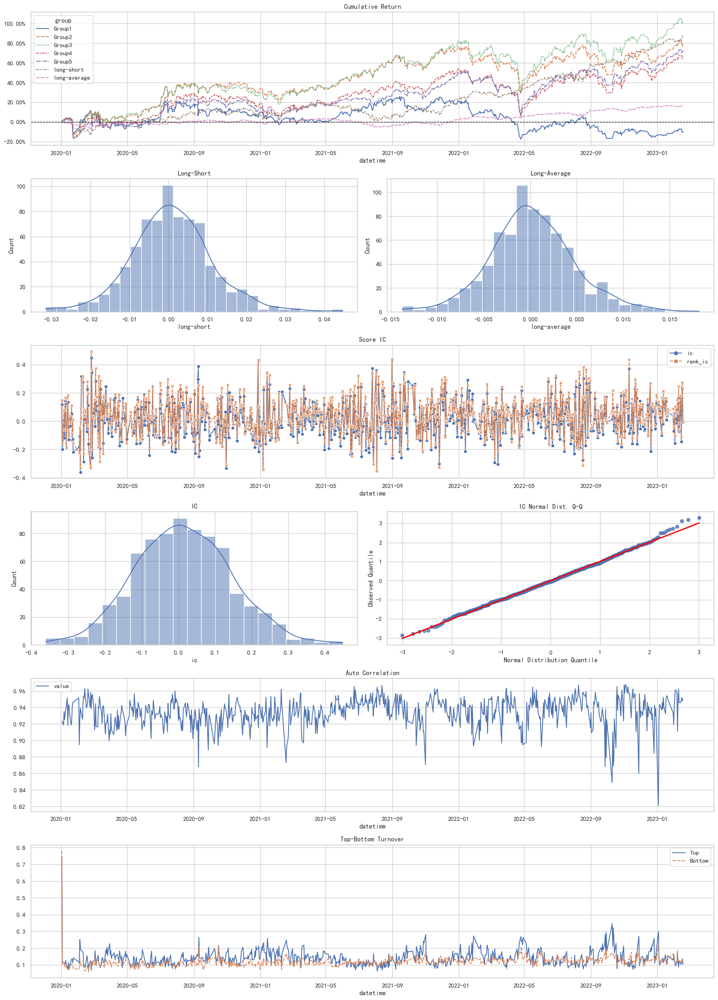

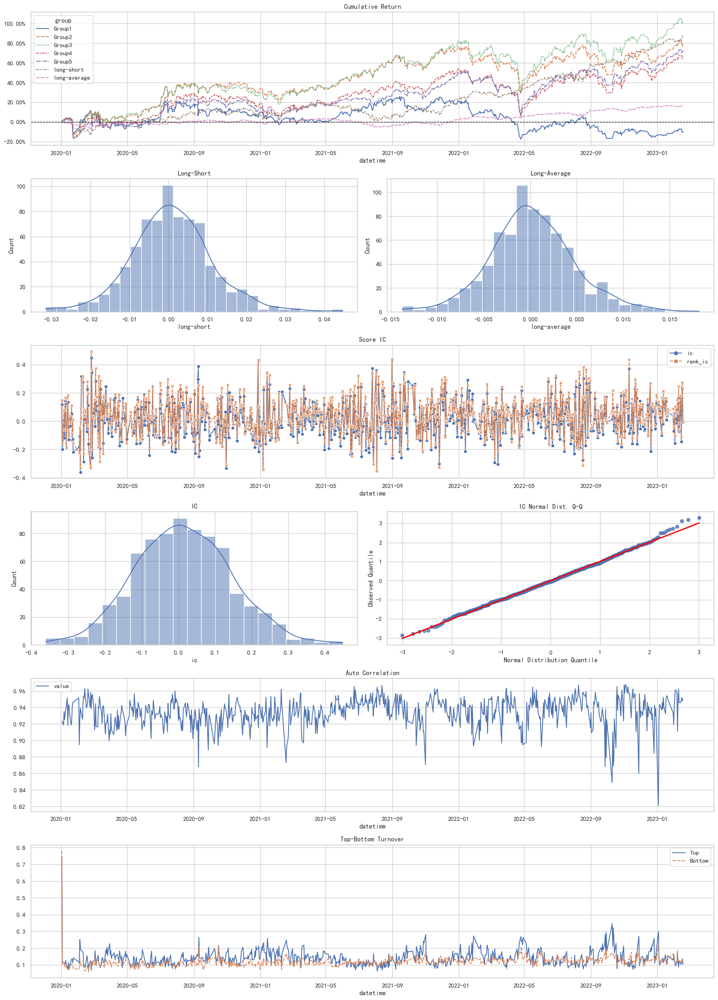

In [14]:
model_performance_graph(pred_label_df,duplicates="drop")

In [15]:
report_normal_1day_df: pd.DataFrame = recorder.load_object(
    "portfolio_analysis/report_normal_1day.pkl")

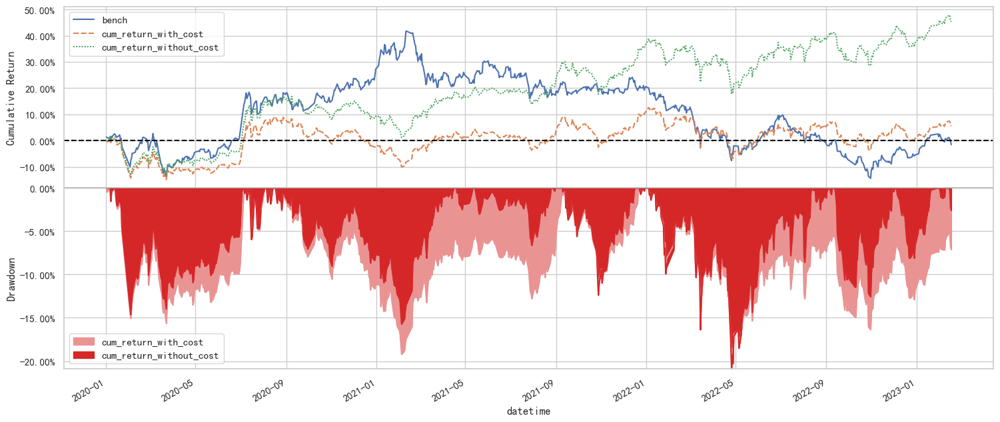

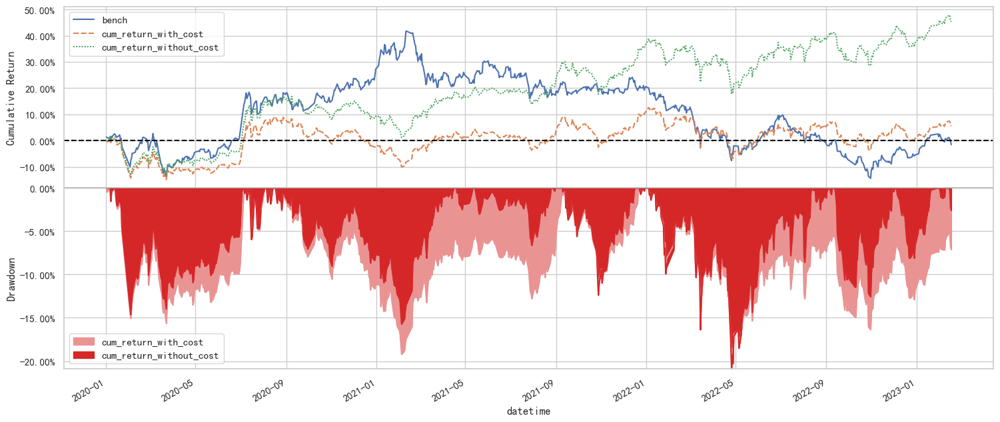

In [16]:
report_graph(report_normal_1day_df)

# 广发证券构造

**特点:加入量的维度**

STR为代表的在美股构建的凸显因子大多从“价”的角度刻画了投资者注意力分 配机制。 STR从“价”的角度刻画凸显的“相对收益率”对投资者关注的影响与投资决策的扭曲，其具有“价格能充分反映投资者关注”的潜在假定，这符合美股市场特征。美股 不设置针对普遍个股的涨跌停制度，且对满足条件的账户适用T+0交易规则，这使得价格能充分变化，美股市场的“价”与关注度高度相关。

然而，如果在中国市场照搬STR因子的构建，就存在违背凸显因子构建的潜在 假定可能，主要体现在两个方面：其一，我国A股市场存在涨跌停限制，极端的价格 都被截尾，使得A股的价格不能像美股一样充分反映投资者关注，同时，涨跌停制度 本身也对投资者关注有重要影响（王朝阳、王振霞，2017；Wang，2017），接近涨 跌停时的“绝对收益率”也会被投资者极大关注；其二，套利限制与投资者结构共同决定了中国市场的交易量与关注度高度相关。

因此，参考何家璇等（2022），从“量”的角度并结合中国涨跌停制度对投资者 关注的影响，构建**凸显因子STV**

与美国市场不同的是，中国股市设置了涨跌停制度。涨跌幅机制设定的阈值无意中给投资者一个明确的“止损/止盈”目标，投资者赶在**触发10%阈值**前卖出或买入，使得涨跌幅接近10%的股会更加凸显。因此，本文在衡量股票收益状态的凸显性时，设置收益阈值，对不同收益率区分处理：
1. 收益率绝对值超过阈值时，认为是所有收益状态中最凸显的，多日的收益率均超过了阈值，则它们的凸显性按照收益率 绝对值的大小降序排序；
2. 收益率绝对值未超过阈值时，凸显性则按照当日换手率降序排序。

STV的凸显性函数如下：

$$\sigma(turnover_{i,s},r_{i,s})=\begin{cases}|r_{i,s}|*1000,\ |r_{i,s}|\geq X \\
turnover_{i,s}, \ |r_{i,s}|\lt X
\end{cases}$$

$|r_{i,s}|*1000$的设定是为了确保绝对收益率超过X的状态是最凸显的。

In [17]:
def get_stv_feature() -> str:
    abs_ret: str = "Abs($close/Ref($close,1)-1)"
    return f"If({abs_ret}>=0.1,{abs_ret}*100,$turnover_rate)"

In [18]:
sigma_frame:pd.DataFrame = D.features(POOLS,fields=[get_stv_feature()])

sigma_frame.columns = ['sigma']

sigma_frame:pd.DataFrame = sigma_frame.unstack(level=0)['sigma']

In [19]:
stv_w:pd.DataFrame = calc_weight(sigma_frame)
STV:pd.DataFrame = stv_w.rolling(20).cov(pct_chg)

STV:pd.Series = STV.stack()
STV.name = "STV"

In [20]:
feature_stv: pd.DataFrame = pd.concat(
    (next_ret, STV), axis=1
)
feature_stv.columns = pd.MultiIndex.from_tuples(
    [("label", "next_ret"), ("feature", "STV")]
)

feature_stv.head()

label feature
                       next_ret     STV
datetime   instrument                  
2013-10-08 000001.SZ   0.039604     NaN
           000002.SZ  -0.011579     NaN
           000004.SZ   0.000770     NaN
           000005.SZ   0.020000     NaN
           000006.SZ   0.006343     NaN

## 单因子分析

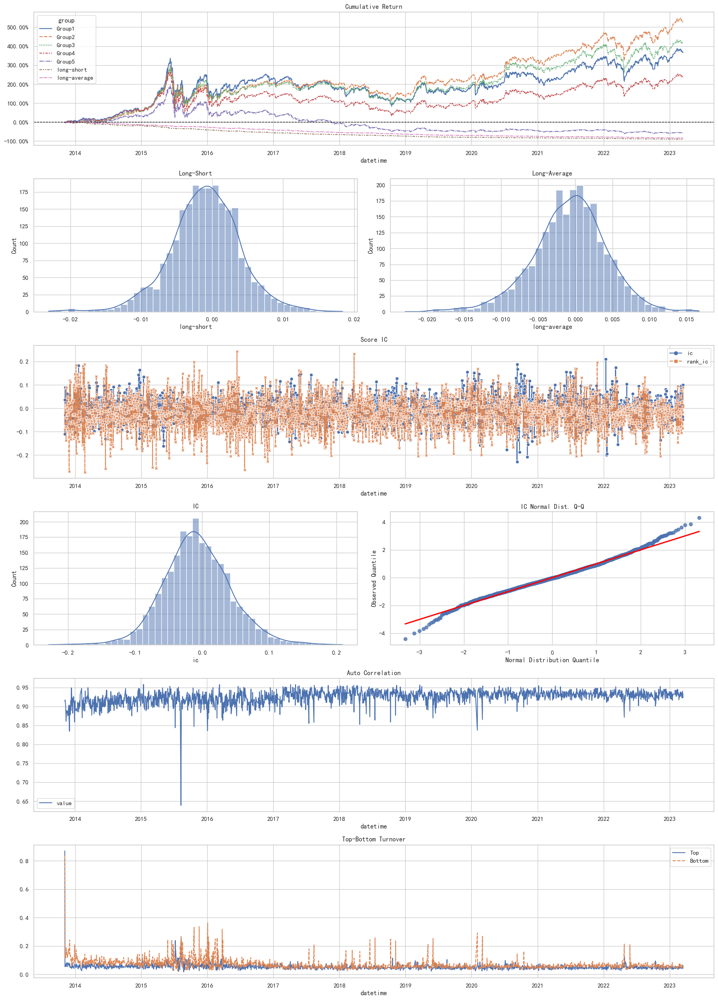

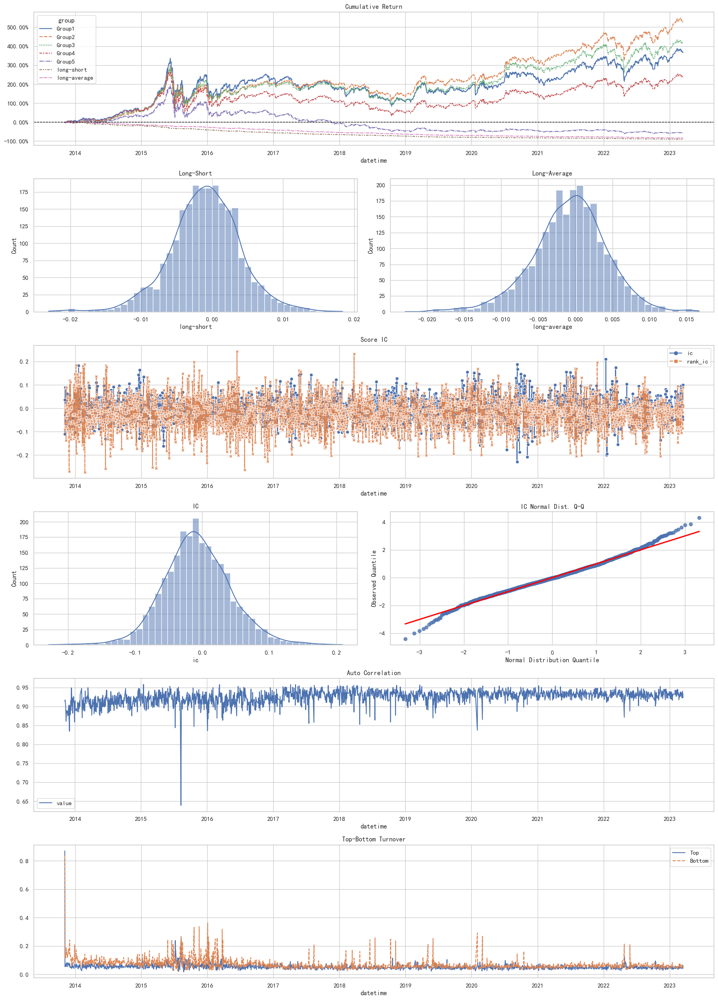

In [21]:
stv_score:pd.DataFrame = feature_stv.dropna().copy()
stv_score.columns = ['label','score']

model_performance_graph(stv_score)

# 复合以上因子

In [22]:
all_data: pd.DataFrame = pd.concat(
    [STR, STV, avg_score_ser, std_score_ser, next_ret], axis=1, sort=True
).dropna()

all_data.columns = pd.MultiIndex.from_tuples(
    [
        ("feature", "STR"),
        ("feature", "STV"),
        ("feature", "avg_score"),
        ("feature", "std_score"),
        ("label", "next_ret"),
    ]
)

In [23]:
TARIN_PERIODS: Tuple = ("2014-01-01", "2017-12-31")
VALID_PERIODS: Tuple = ("2018-01-01", "2019-12-31")
TEST_PERIODS: Tuple = ("2020-01-01", "2023-02-17")

learn_processors = [DropnaLabel()]
infer_processors = [ProcessInf(), CSRankNorm(), Fillna()]

sdl = StaticDataLoader(config=all_data)
dh_pr = DataHandlerLP(
    instruments=POOLS,
    start_time=TARIN_PERIODS[0],
    end_time=TEST_PERIODS[1],
    process_type=DataHandlerLP.PTYPE_A,
    learn_processors=learn_processors,
    infer_processors=infer_processors,
    data_loader=sdl,
)

ds = DatasetH(
    dh_pr,
    segments={"train": TARIN_PERIODS, "valid": VALID_PERIODS, "test": TEST_PERIODS},
)

[12588:MainThread](2023-04-11 18:16:31,908) INFO - qlib.timer - [log.py:128] - Time cost: 0.609s | Loading data Done
[12588:MainThread](2023-04-11 18:16:35,465) INFO - qlib.timer - [log.py:128] - Time cost: 3.496s | ProcessInf Done
[12588:MainThread](2023-04-11 18:16:50,173) INFO - qlib.timer - [log.py:128] - Time cost: 14.707s | CSRankNorm Done
[12588:MainThread](2023-04-11 18:16:50,307) INFO - qlib.timer - [log.py:128] - Time cost: 0.133s | Fillna Done
[12588:MainThread](2023-04-11 18:16:50,393) INFO - qlib.timer - [log.py:128] - Time cost: 0.080s | DropnaLabel Done
[12588:MainThread](2023-04-11 18:16:50,394) INFO - qlib.timer - [log.py:128] - Time cost: 18.487s | fit & process data Done
[12588:MainThread](2023-04-11 18:16:50,395) INFO - qlib.timer - [log.py:128] - Time cost: 19.098s | Init data Done


In [24]:
record_dict: Dict = run_model(
    ds,
    "gbdt",
    start_time=TEST_PERIODS[0],
    end_time=TEST_PERIODS[1],
    experiment_name="factor",
    trained_model="trained_model.pkl",
)

[18:16:50] 实验名:factor,训练模型:trained_model.pkl,开始运行...                                ]8;id=518037;file://d:\WorkSpace\visualization_stock_market\sqlalchemy_to_data\测试相关\凸显度因子\scr\qlib_workflow.py\qlib_workflow.py]8;;\:]8;id=473751;file://d:\WorkSpace\visualization_stock_market\sqlalchemy_to_data\测试相关\凸显度因子\scr\qlib_workflow.py#347\347]8;;\

[12588:MainThread](2023-04-11 18:16:50,448) INFO - qlib.workflow - [exp.py:258] - Experiment 3 starts running ...
[12588:MainThread](2023-04-11 18:16:50,463) INFO - qlib.workflow - [recorder.py:341] - Recorder a57b3606c2d54ba8a034d3aa0bd19c1a starts running under Experiment 3 ...


Training until validation scores don't improve for 200 rounds
[20]	train's l2: 0.994851	valid's l2: 0.994927
[40]	train's l2: 0.9941	valid's l2: 0.994315
[60]	train's l2: 0.99374	valid's l2: 0.994156
[80]	train's l2: 0.993478	valid's l2: 0.994126
[100]	train's l2: 0.993277	valid's l2: 0.994132
[120]	train's l2: 0.993116	valid's l2: 0.994152
[140]	train's l2: 0.992972	valid's l2: 0.994184
[160]	train's l2: 0.992853	valid's l2: 0.994215
[180]	train's l2: 0.99275	valid's l2: 0.994237
[200]	train's l2: 0.992656	valid's l2: 0.994264
[220]	train's l2: 0.992572	valid's l2: 0.994294
[240]	train's l2: 0.992503	valid's l2: 0.994316
[260]	train's l2: 0.992437	valid's l2: 0.994339
[280]	train's l2: 0.992381	valid's l2: 0.994354
Early stopping, best iteration is:
[85]	train's l2: 0.993415	valid's l2: 0.994122


[12588:MainThread](2023-04-11 18:16:58,879) INFO - qlib.workflow - [record_temp.py:196] - Signal record 'pred.pkl' has been saved as the artifact of the Experiment 3


'The following are prediction results of the LGBModel model.'
                          score
datetime   instrument          
2020-01-02 000001.SZ   0.039203
           000002.SZ  -0.017701
           000004.SZ  -0.035908
           000005.SZ   0.028727
           000006.SZ   0.062739
{'IC': 0.014846618796417478,
 'ICIR': 0.11830622767811422,
 'Rank IC': 0.046478059414275436,
 'Rank ICIR': 0.38094279867410863}


[12588:MainThread](2023-04-11 18:17:00,409) INFO - qlib.backtest caller - [__init__.py:93] - Create new exchange
[12588:MainThread](2023-04-11 18:17:24,890) WARNING - qlib.online operator - [exchange.py:219] - $open field data contains nan.
[12588:MainThread](2023-04-11 18:17:24,894) WARNING - qlib.online operator - [exchange.py:219] - $open field data contains nan.
[12588:MainThread](2023-04-11 18:17:28,268) WARNING - qlib.BaseExecutor - [executor.py:121] - `common_infra` is not set for <qlib.backtest.executor.SimulatorExecutor object at 0x000001D41503FE20>


backtest loop:   0%|          | 0/757 [00:00<?, ?it/s]

d:\anaconda3\envs\qlib_env\lib\site-packages\qlib\utils\index_data.py:482: RuntimeWarning: Mean of empty slice
  return np.nanmean(self.data)
[12588:MainThread](2023-04-11 18:17:33,073) INFO - qlib.workflow - [record_temp.py:505] - Portfolio analysis record 'port_analysis_1day.pkl' has been saved as the artifact of the Experiment 3


'The following are analysis results of benchmark return(1day).'
                       risk
mean               0.000063
std                0.012879
annualized_return  0.014996
information_ratio  0.075474
max_drawdown      -0.473379
'The following are analysis results of the excess return without cost(1day).'
                       risk
mean               0.000732
std                0.009860
annualized_return  0.174133
information_ratio  1.144779
max_drawdown      -0.407499
'The following are analysis results of the excess return with cost(1day).'
                       risk
mean               0.000313
std                0.009860
annualized_return  0.074441
information_ratio  0.489356
max_drawdown      -0.497347


[12588:MainThread](2023-04-11 18:17:33,086) INFO - qlib.workflow - [record_temp.py:530] - Indicator analysis record 'indicator_analysis_1day.pkl' has been saved as the artifact of the Experiment 3


'The following are analysis results of indicators(1day).'
     value
ffr    1.0
pa     0.0
pos    0.0
info {'class': 'Recorder', 'id': 'a57b3606c2d54ba8a034d3aa0bd19c1a', 'name': 'mlflow_recorder', 'experiment_id': '3', 'start_time': '2023-04-11 18:16:50', 'end_time': None, 'status': 'RUNNING'}


[12588:MainThread](2023-04-11 18:17:33,096) INFO - qlib.timer - [log.py:128] - Time cost: 0.003s | waiting `async_log` Done


In [25]:
try:
    recorder = record_dict['recorder']
except NameError:
    # 使用已有模型
    from qlib.workflow import R
    import pickle

    with open("../筹码分布算法/factor_data/turnovercoeff_dataset.pkl", "rb") as f:
        turncoeff_dataset = pickle.load(f)

    with R.start():
        recorder = R.get_recorder(
            recorder_name="mlflow_recorder",
            recorder_id="7eefa18e7b4341f680927657e1de8fa0",
        )

label_df = recorder.load_object("label.pkl")
label_df.columns = ["label"]
pred_df: pd.DataFrame = recorder.load_object("pred.pkl")

# 创建测试集"预测"和“标签”对照表
pred_label_df: pd.DataFrame = pd.concat([pred_df, label_df], axis=1, sort=True).reindex(
    label_df.index
)

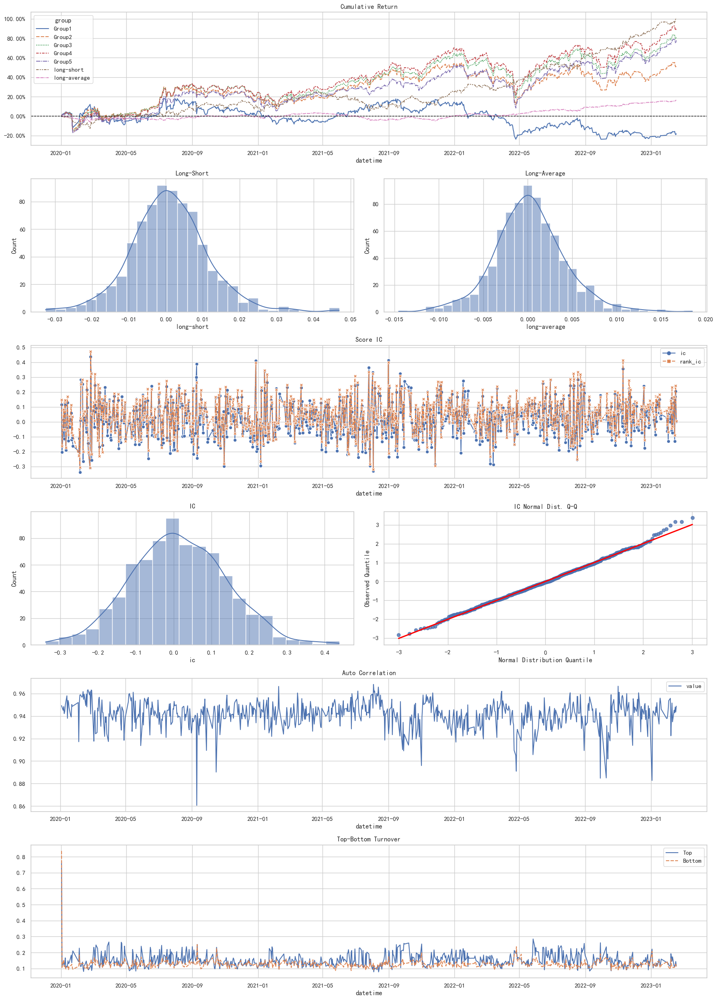

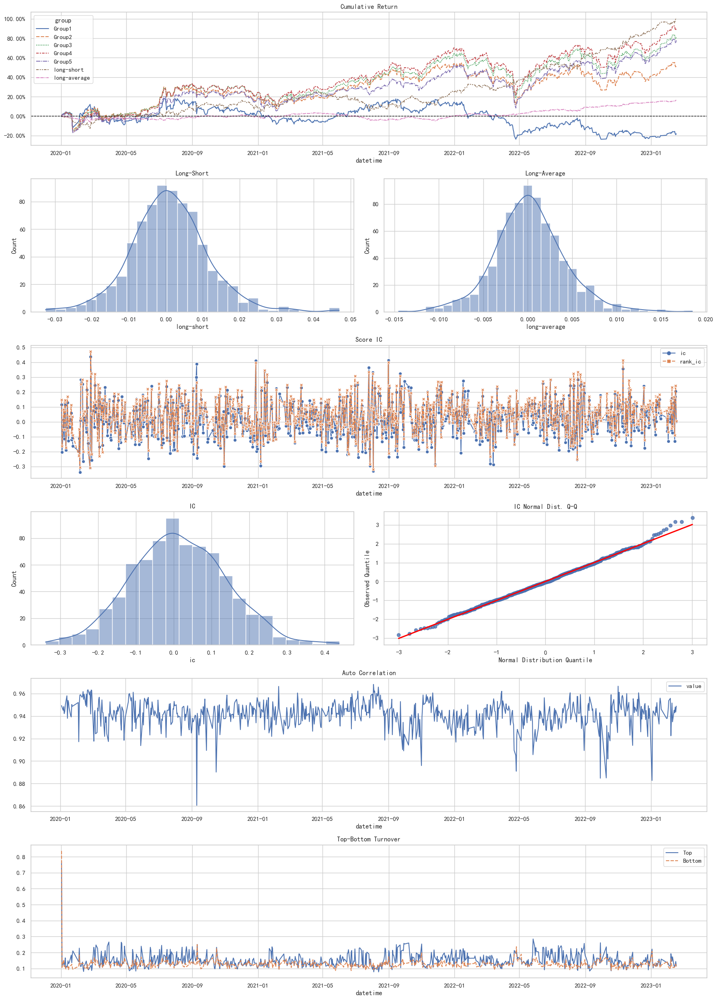

In [26]:
model_performance_graph(pred_label_df,duplicates="drop")

In [27]:
report_normal_1day_df: pd.DataFrame = recorder.load_object(
    "portfolio_analysis/report_normal_1day.pkl")

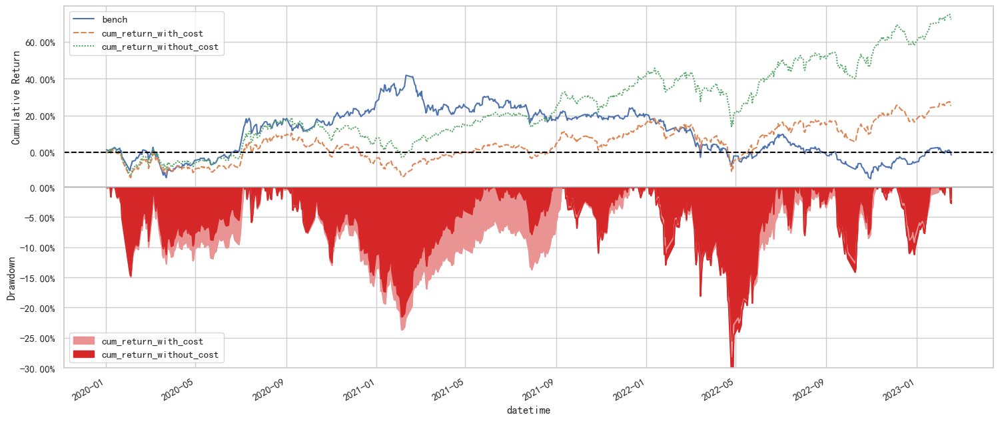

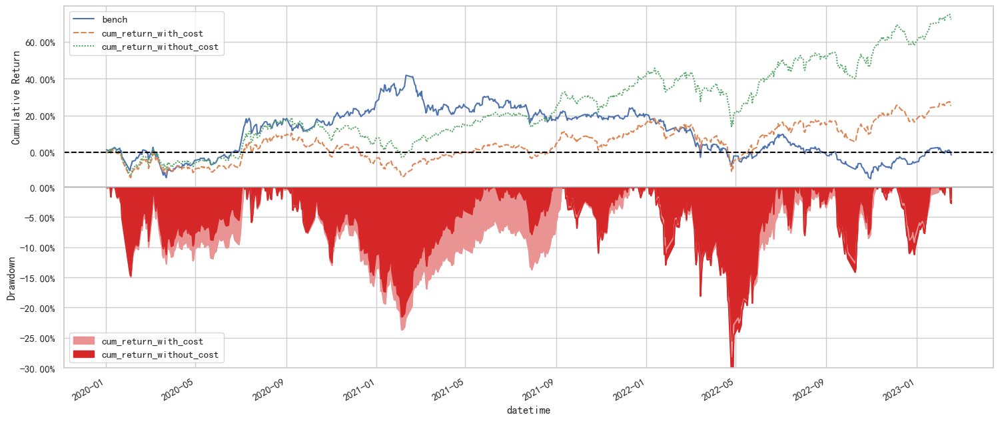

In [28]:
report_graph(report_normal_1day_df)